# Music Analysis

In [ ]:
import IPython.display as ipd
import warnings
warnings.filterwarnings('ignore')

## Data Import

In [ ]:
# Connect to Google drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Access Data Path

import os

print(list(os.listdir('/content/drive/MyDrive/602FinalProject/Data/')))

['features_30_sec.csv', 'features_3_sec.csv', 'genres_original', 'images_original']


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
data_path = '/content/drive/MyDrive/602FinalProject/Data/'

In [ ]:
import os

def print_tree(directory, prefix=''):
    """Recursively prints a formatted tree of the directory structure with files and subdirectories."""
    files = []
    # Get all directory entries
    entries = sorted(os.listdir(directory))
    # Separate files and directories
    dirs = [d for d in entries if os.path.isdir(os.path.join(directory, d))]
    files = [f for f in entries if os.path.isfile(os.path.join(directory, f))]

    # Print directories and recurse into them
    for i, d in enumerate(dirs):
        print(prefix + '├──' + d)
        if i == len(dirs) - 1 and not files:  # If last directory and no files, change prefix
            sub_prefix = prefix + '    '
        else:
            sub_prefix = prefix + '│   '
        # Recursive call for subdirectories
        print_tree(os.path.join(directory, d), sub_prefix)

    # Print files
    for i, f in enumerate(files):
        connector = '└──' if i == len(files) - 1 else '├──'
        print(prefix + connector + f)

print_tree(data_path)

├──genres_original
│   ├──blues
│   │   ├──blues.00000.wav
│   │   ├──blues.00001.wav
│   │   ├──blues.00002.wav
│   │   ├──blues.00003.wav
│   │   ├──blues.00004.wav
│   │   ├──blues.00005.wav
│   │   ├──blues.00006.wav
│   │   ├──blues.00007.wav
│   │   ├──blues.00008.wav
│   │   ├──blues.00009.wav
│   │   ├──blues.00010.wav
│   │   ├──blues.00011.wav
│   │   ├──blues.00012.wav
│   │   ├──blues.00013.wav
│   │   ├──blues.00014.wav
│   │   ├──blues.00015.wav
│   │   ├──blues.00016.wav
│   │   ├──blues.00017.wav
│   │   ├──blues.00018.wav
│   │   ├──blues.00019.wav
│   │   ├──blues.00020.wav
│   │   ├──blues.00021.wav
│   │   ├──blues.00022.wav
│   │   ├──blues.00023.wav
│   │   ├──blues.00024.wav
│   │   ├──blues.00025.wav
│   │   ├──blues.00026.wav
│   │   ├──blues.00027.wav
│   │   ├──blues.00028.wav
│   │   ├──blues.00029.wav
│   │   ├──blues.00030.wav
│   │   ├──blues.00031.wav
│   │   ├──blues.00032.wav
│   │   ├──blues.00033.wav
│   │   ├──blues.00034.wav
│   │   ├──blues.00035.

In [ ]:
import numpy as np
import librosa
import librosa.display

# Importing a file
y, sr = librosa.load(f'{data_path}/genres_original/reggae/reggae.00036.wav')

print('y:', y, '\n')
print('y shape:', np.shape(y), '\n')
print('Sample Rate (KHz):', sr, '\n')

# Verify length of the audio
print('Check Len of Audio:', np.shape(y)[0]/sr)

y: [0.02072144 0.04492188 0.05422974 ... 0.06912231 0.08303833 0.08572388] 

y shape: (661794,) 

Sample Rate (KHz): 22050 

Check Len of Audio: 30.013333333333332


In [ ]:
# Trim leading and trailing silence from an audio signal (silence before and after the actual audio)
y_trimmed, _ = librosa.effects.trim(y)

# the result is an numpy ndarray
print('Audio File:', y_trimmed, '\n')
print('Audio File shape:', np.shape(y_trimmed))

Audio File: [0.02072144 0.04492188 0.05422974 ... 0.06912231 0.08303833 0.08572388] 

Audio File shape: (661794,)


## Data EDA
## 2D Vizualization of Sound Waves

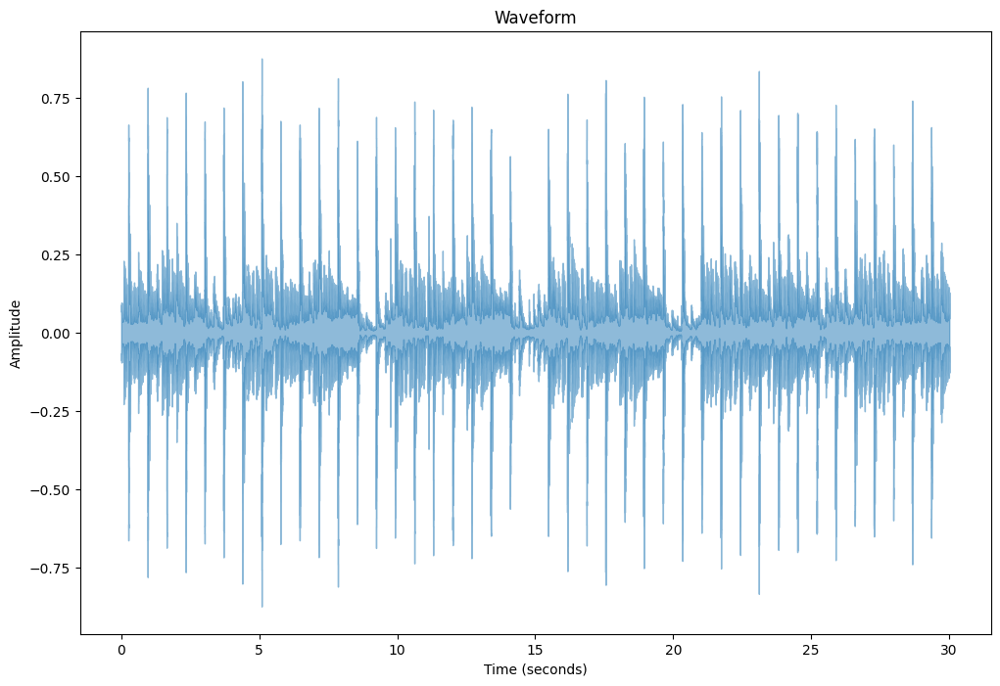

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import sklearn


# Plotting the waveform
plt.figure(figsize=(12, 8))

# Waveform plot
librosa.display.waveshow(y_trimmed, sr=sr, alpha=0.5)
plt.title('Waveform')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')

plt.show()

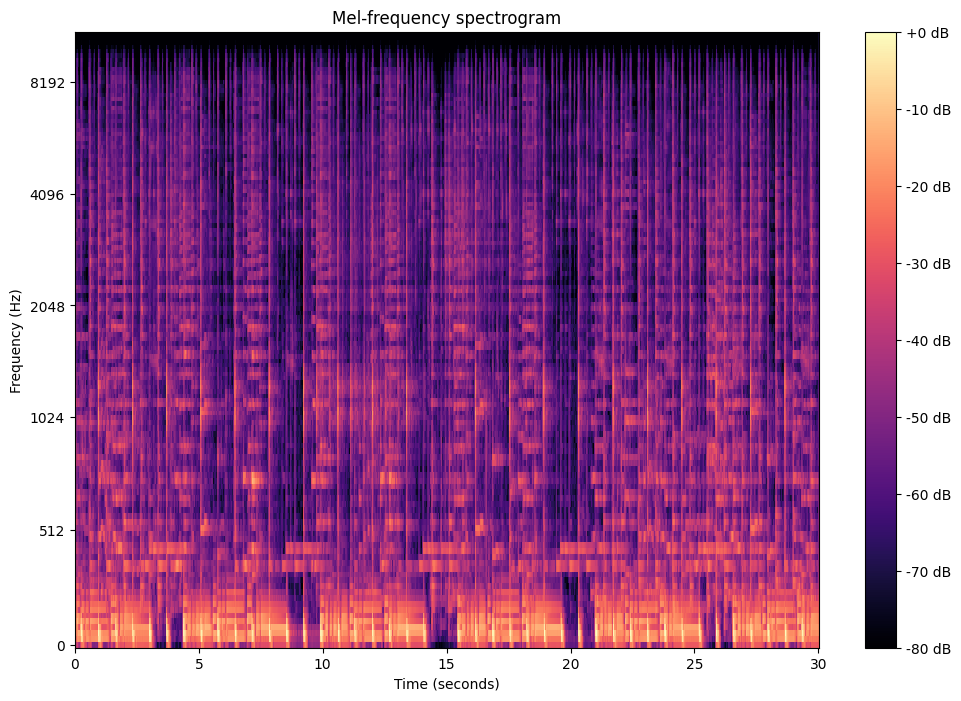

In [ ]:
# Spectrogram plot

plt.figure(figsize=(12, 8))

S = librosa.feature.melspectrogram(y=y_trimmed, sr=sr)
S_dB = librosa.power_to_db(S, ref=np.max)
librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel-frequency spectrogram')
plt.xlabel('Time (seconds)')
plt.ylabel('Frequency (Hz)')

plt.show()

## Fourier Transform of Audio Data

To analyze the frequency content of the audio file, we will perform a Fourier Transform using the Fast Fourier Transform (FFT) algorithm. This transformation will decompose the time-domain signal into its frequency components, helping us understand the distribution of frequencies in the audio file.

In [ ]:
# Default FFT window size
n_fft = 2048
hop_length = 512

# Perform the short-time Fourier transform (STFT)
D = np.abs(librosa.stft(y_trimmed, n_fft=n_fft, hop_length=hop_length))

# To get frequency values that correspond to D, use librosa's fft_frequencies function
frequencies = librosa.fft_frequencies(sr=sr, n_fft=n_fft)

# To get time values that correspond to D, use librosa's frames_to_time function
times = librosa.frames_to_time(np.arange(D.shape[1]), sr=sr, hop_length=hop_length)


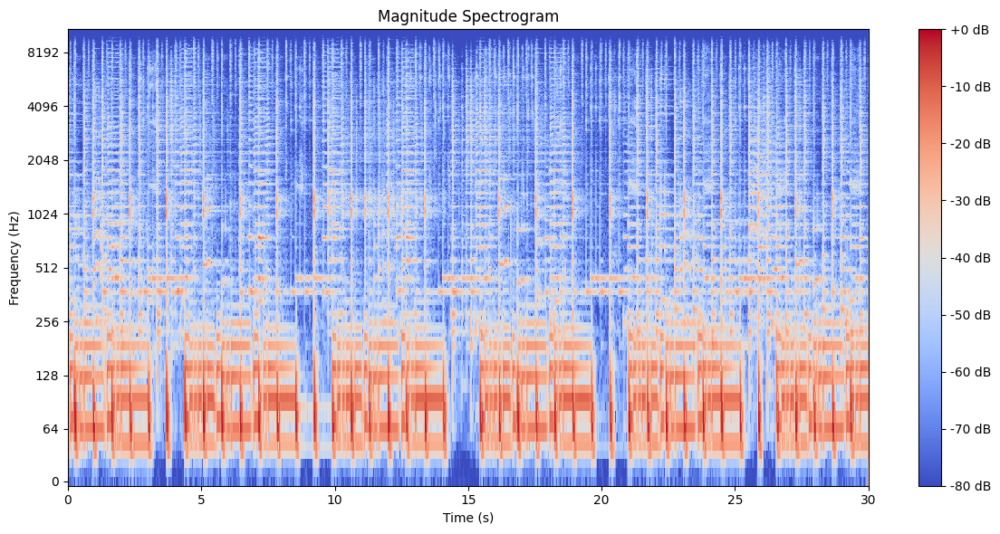

In [ ]:
# Plotting the Spectrogram of the audio signal
plt.figure(figsize=(12, 6))
librosa.display.specshow(librosa.amplitude_to_db(D, ref=np.max),
                         sr=sr, hop_length=hop_length,
                         x_axis='time', y_axis='log', cmap='coolwarm')

plt.colorbar(format='%+2.0f dB')
plt.title('Magnitude Spectrogram')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.tight_layout()
plt.show()


The plot displays the frequency spectrum of the audio. Frequencies with higher magnitudes represent dominant frequencies in the audio signal. Using a logarithmic scale helps in visually identifying these dominant frequencies across a wide range of values, making it easier to observe the characteristics of the audio at both low and high frequencies.

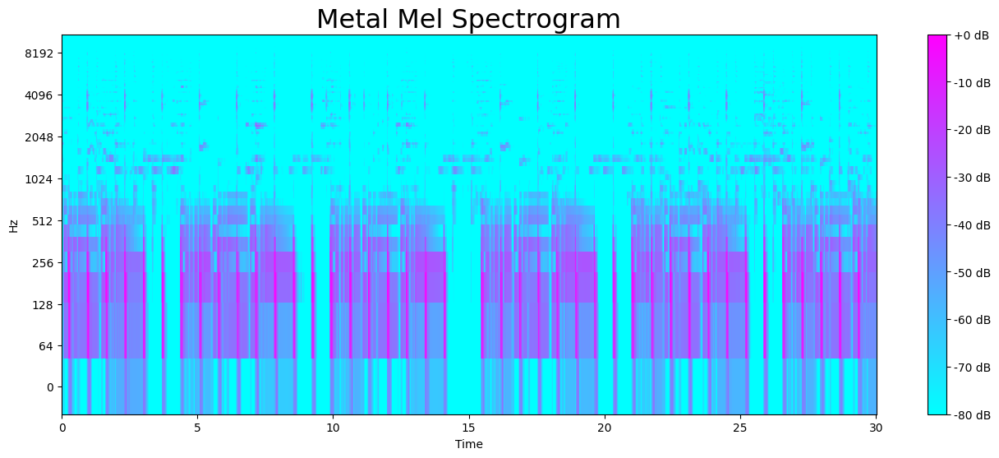

In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

# Load the audio file

# Importing a file
y, sr = librosa.load(f'{data_path}/genres_original/reggae/reggae.00036.wav')

# Trim silence from the beginning and the end of the audio signal
y, _ = librosa.effects.trim(y)


# Create a Mel Spectrogram
S = librosa.feature.melspectrogram(y=y, sr=sr)
S_DB = librosa.amplitude_to_db(S, ref=np.max)

# Plot the spectrogram
plt.figure(figsize=(16, 6))
hop_length = 512
librosa.display.specshow(S_DB, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', cmap='cool')
plt.colorbar(format='%+2.0f dB')
plt.title("Metal Mel Spectrogram", fontsize=23)
plt.show()

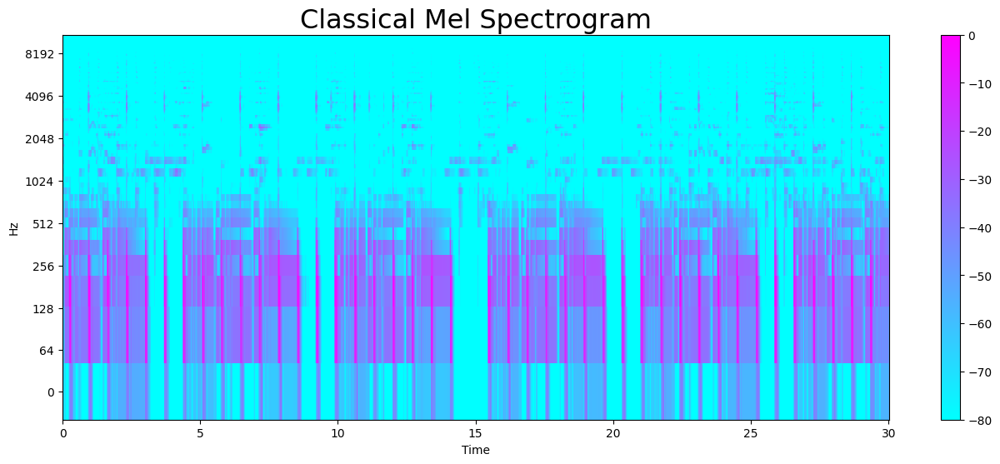

In [ ]:
plt.figure(figsize = (16, 6))
librosa.display.specshow(S_DB, sr=sr, hop_length=hop_length, x_axis = 'time', y_axis = 'log',
                        cmap = 'cool');
plt.colorbar();
plt.title("Classical Mel Spectrogram", fontsize = 23);

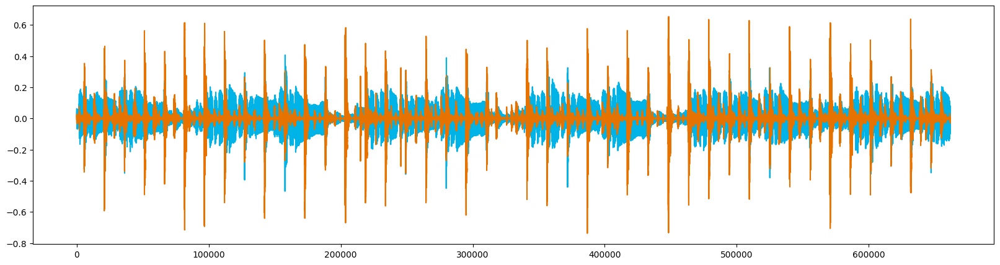

In [ ]:
import librosa
import matplotlib.pyplot as plt

# Load your audio file

y_harm, y_perc = librosa.effects.hpss(y_trimmed)

# Create a plot with new dimensions and new color codes
plt.figure(figsize=(20, 5))
plt.plot(y_harm, color='#00B3E6')
plt.plot(y_perc, color='#E67300')
plt.show()

In [ ]:
import librosa
import sklearn.preprocessing
import numpy as np


# Calculate the Spectral Centroids
spectral_centroids = librosa.feature.spectral_centroid(y=y_trimmed, sr=sr)[0]
print('Centroids:', spectral_centroids)
print('Shape of Spectral Centroids:', spectral_centroids.shape)

# Computing the time variable for visualization
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames, sr=sr)
print('Frames:', frames)
print('t:', t)

# Function that normalizes the Sound Data
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

# Additional Features
# Calculate the Zero Crossing Rate
zero_crossings = librosa.feature.zero_crossing_rate(y_trimmed)[0]
print('Zero Crossing Rate:', zero_crossings)
print()
# Calculate the Spectral Rolloff
spectral_rolloff = librosa.feature.spectral_rolloff(y=y_trimmed, sr=sr)[0]
print('Spectral Rolloff:', spectral_rolloff)
print()
# Calculate the Chroma Frequencies
chroma_frequencies = librosa.feature.chroma_stft(y=y_trimmed, sr=sr)
print('Chroma Frequencies:', chroma_frequencies)

Centroids: [1758.29476821 1946.74243805 2038.81133429 ...  766.50415702 1041.07728753
 1391.05146262]
Shape of Spectral Centroids: (1293,)
Frames: range(0, 1293)
t: [0.00000000e+00 2.32199546e-02 4.64399093e-02 ... 2.99537415e+01
 2.99769615e+01 3.00001814e+01]
Zero Crossing Rate: [0.06054688 0.08984375 0.09570312 ... 0.01611328 0.01367188 0.01171875]

Spectral Rolloff: [3854.44335938 4209.74121094 4382.00683594 ... 1787.25585938 2637.81738281
 3768.31054688]

Chroma Frequencies: [[0.44634703 0.2464093  0.16570735 ... 0.41837153 0.39619943 0.43134886]
 [1.         1.         1.         ... 0.87427783 0.8235255  0.8242753 ]
 [0.3678864  0.28299838 0.42759463 ... 0.5325745  0.5388906  0.74288267]
 ...
 [0.18599956 0.2417062  0.36689132 ... 0.12964341 0.15941519 0.2528019 ]
 [0.17758146 0.1223929  0.12990028 ... 0.07789875 0.1082027  0.20623319]
 [0.21894594 0.09096979 0.07491199 ... 0.12620953 0.12962638 0.22190419]]




Spectral Centroids

Output: Array values like 1758.29476821, 1946.74243805, 2038.81133429, …, 766.50415702, 1041.07728753, 1391.05146262
Explanation: These values represent the center of mass of the spectral energy distribution at each frame. Higher values (like 2038.81) suggest that the sound is brighter or has higher frequencies at that moment, whereas lower values (like 766.50) indicate duller or bass-heavy sounds.

Zero Crossing Rate

Output: Array values like 0.06054688, 0.08984375, 0.09570312, …, 0.01611328, 0.01367188, 0.01171875
Explanation: These values show the rate at which the audio signal changes sign. Higher values (like 0.09570312) often occur in noisier and more percussive parts of the audio, while lower values (like 0.01171875) indicate more sustained tones.

Spectral Rolloff

Output: Array values like 3854.44335938, 4209.74121094, 4382.00683594, …, 1787.25585938, 2637.81738281, 3768.31054688
Explanation: This feature measures the frequency below which a certain percentage (typically 85% to 95%) of the total spectral energy is located. Early frames show higher rolloff points (like 4382.00) indicating the presence of high-frequency components, while later frames with lower rolloff values (like 1787.25) indicate a dominance of lower frequencies.

Chroma Frequencies

Output: 2D array where each row represents one of the 12 pitch classes. Example values from the array are 0.4463468, 0.24640933, 0.16570742, …, 0.4183716, 0.3961995, 0.43134883], [1.0, 1.0, 1.0, …, 0.87427765, 0.82352567, 0.82427514
Explanation: Each row in this array corresponds to one of the 12 traditional Western music pitch classes and indicates how much energy is present at each pitch class throughout the audio. High values (like 1.0 in the second row across multiple columns) indicate strong presence or dominance of that pitch class at certain points in the audio, showing key tonal and harmonic content.



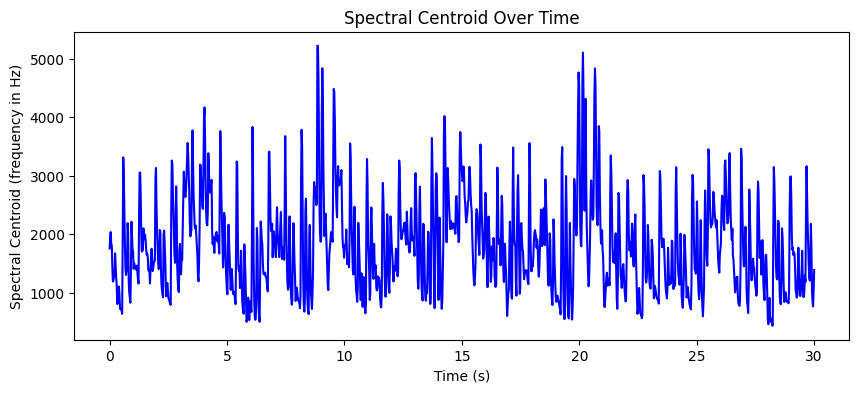

In [ ]:
# Computing the time variable for visualization
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames, sr=sr)

# Plotting
plt.figure(figsize=(10, 4))
plt.plot(t, spectral_centroids, color='b')  # Plotting in blue
plt.xlabel('Time (s)')
plt.ylabel('Spectral Centroid (frequency in Hz)')
plt.title('Spectral Centroid Over Time')
plt.show()

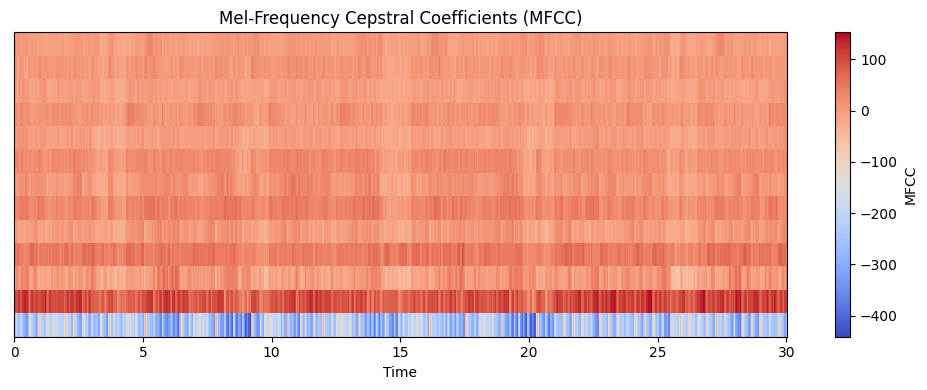

In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np


# Compute MFCCs from the audio file
mfccs = librosa.feature.mfcc(y=y_trimmed, sr=sr, n_mfcc=13)  # n_mfcc is typically 13 for basic voice recognition tasks

# Plotting the MFCCs
plt.figure(figsize=(10, 4))
librosa.display.specshow(mfccs, sr=sr, x_axis='time')
plt.colorbar(label='MFCC')
plt.title('Mel-Frequency Cepstral Coefficients (MFCC)')
plt.tight_layout()
plt.show()

MFCCs are commonly used in audio processing, particularly in speech recognition and music information retrieval, as they effectively represent the short-term power spectrum of sound

In [ ]:
import librosa
import sklearn.preprocessing


# Scale the MFCC data
scaler = sklearn.preprocessing.StandardScaler()
mfccs_scaled = scaler.fit_transform(mfccs.T).T  # Transpose to scale each coefficient across time frames

# Now mfccs_scaled contains the scaled MF​CC

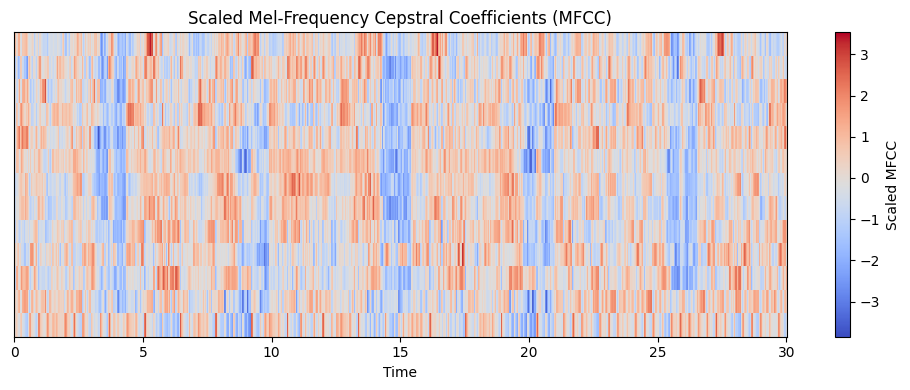

In [ ]:


# Plotting the scaled MFCCs
plt.figure(figsize=(10, 4))
librosa.display.specshow(mfccs_scaled, sr=sr, x_axis='time')
plt.colorbar(label='Scaled MFCC')
plt.title('Scaled Mel-Frequency Cepstral Coefficients (MFCC)')
plt.tight_layout()
plt.show()

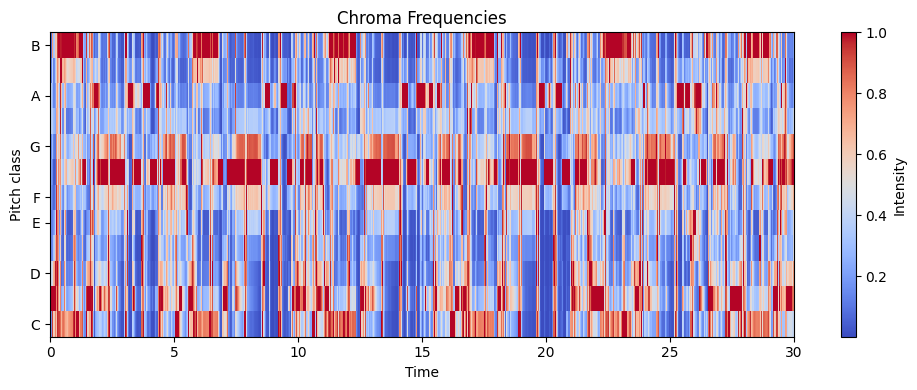

In [ ]:


# Plotting the Chroma Frequencies
plt.figure(figsize=(10, 4))
librosa.display.specshow(chroma_frequencies, x_axis='time', y_axis='chroma', cmap='coolwarm')
plt.colorbar(label='Intensity')
plt.title('Chroma Frequencies')
plt.tight_layout()
plt.show()

DATA ANALYSIS

In [ ]:
import pandas as pd

df = pd.read_csv(f'{data_path}/features_30_sec.csv')
df.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


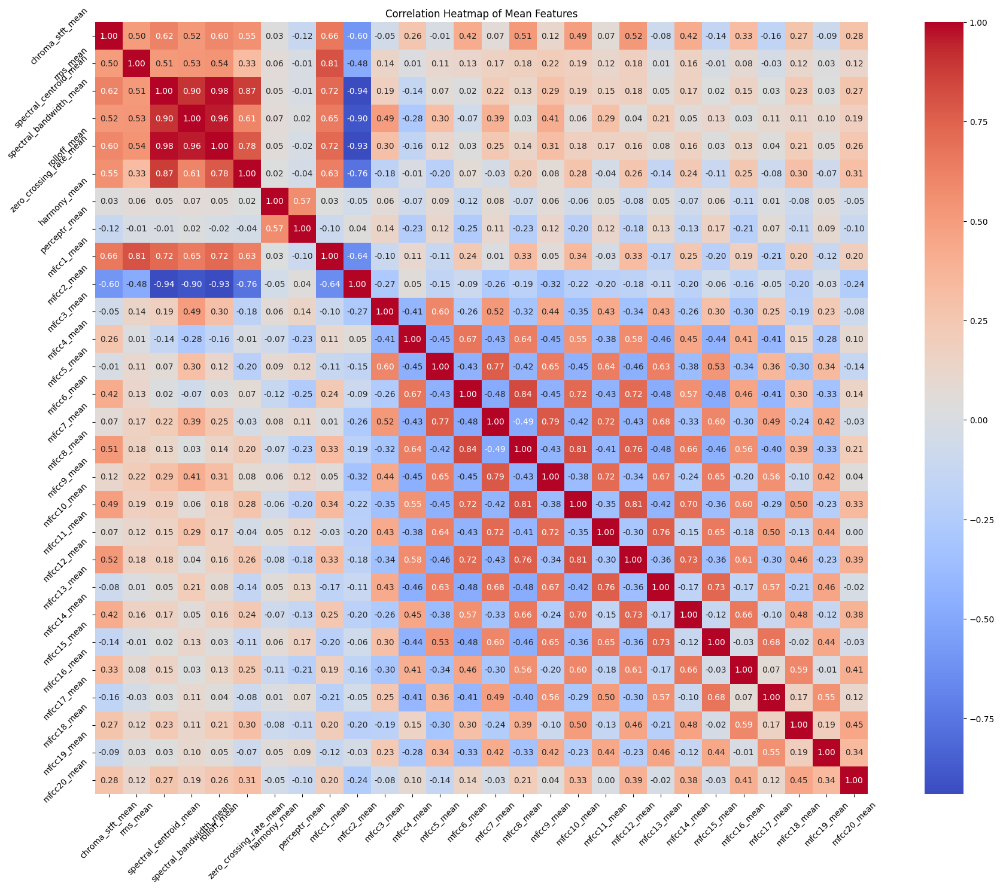

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# Filter columns that include 'mean' in their column names
mean_features = df.filter(regex='mean')

# Calculate the correlation matrix for the mean features
correlation_matrix = mean_features.corr()

# Plotting the correlation heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Correlation Heatmap of Mean Features')
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()

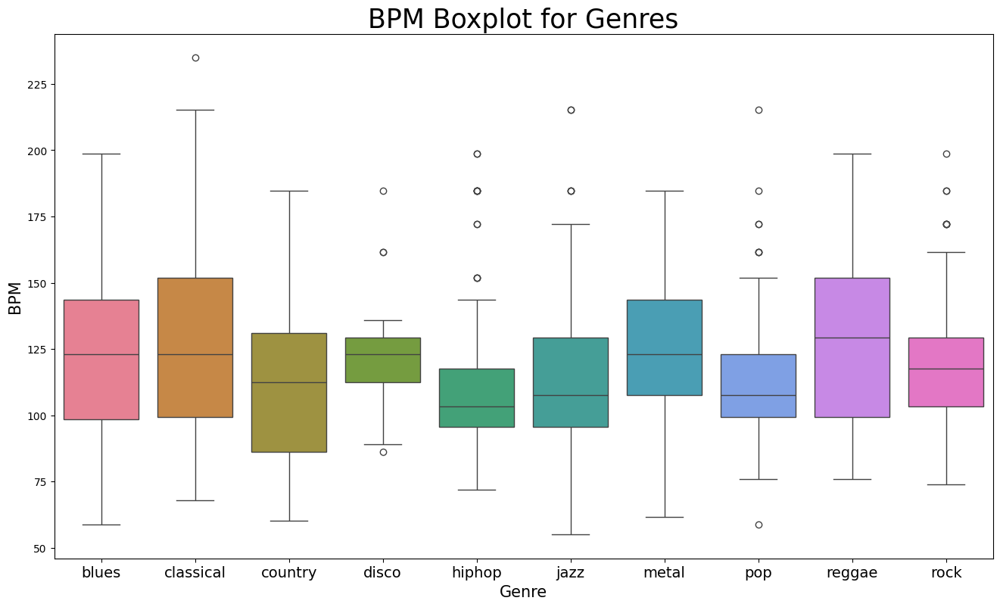

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df is your DataFrame
x = df[["label", "tempo"]]

# Creating the boxplot
f, ax = plt.subplots(figsize=(16, 9))
sns.boxplot(x="label", y="tempo", data=x, palette='husl')

# Setting the plot titles and labels with updated font sizes
plt.title('BPM Boxplot for Genres', fontsize=25)
plt.xticks(fontsize=14)
plt.yticks(fontsize=10)
plt.xlabel("Genre", fontsize=15)
plt.ylabel("BPM", fontsize=15)

# Saving the figure
plt.savefig("BPM_Boxplot.jpg")
plt.show()  # Adding this line to display the plot as well as saving it

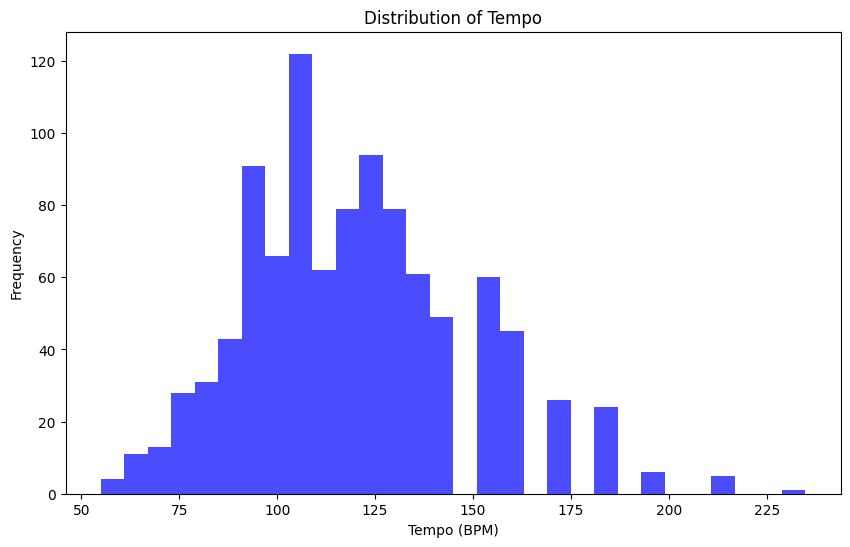

In [ ]:
import matplotlib.pyplot as plt

# Plotting a histogram of the 'tempo' feature
plt.figure(figsize=(10, 6))
plt.hist(df['tempo'], bins=30, color='blue', alpha=0.7)
plt.title('Distribution of Tempo')
plt.xlabel('Tempo (BPM)')
plt.ylabel('Frequency')
plt.show()

In [ ]:
from sklearn import preprocessing
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer

# Removing the 'label' column
X = df.drop('label', axis=1)
y = df['label']

#### Convert all columns to numeric, setting errors='coerce' to turn non-convertibles into NaN ####
X = X.apply(pd.to_numeric, errors='coerce')

# Optionally, check for any columns that are entirely NaN and drop them if necessary
nan_columns = X.columns[X.isna().all()]
X.drop(nan_columns, axis=1, inplace=True)

#### Impute NaN values using the mean of each column ####
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)
X_imputed_df = pd.DataFrame(X_imputed, columns=X.columns[X.notna().any()])  # Adjust columns to those that have any non-NaN values

#### NORMALIZE X ####
min_max_scaler = preprocessing.MinMaxScaler()
X_normalized = min_max_scaler.fit_transform(X_imputed_df)
X_normalized_df = pd.DataFrame(X_normalized, columns=X_imputed_df.columns)

#### PCA 2 COMPONENTS ####
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_normalized_df)
principalDf = pd.DataFrame(data=principalComponents, columns=['principal component 1', 'principal component 2'])

# Concatenate with target label
finalDf = pd.concat([principalDf, y.reset_index(drop=True)], axis=1)

# Display the explained variance ratio
explained_variance = pca.explained_variance_ratio_
print("Explained Variance Ratio:", explained_variance)

Explained Variance Ratio: [0.2439355  0.21781804]


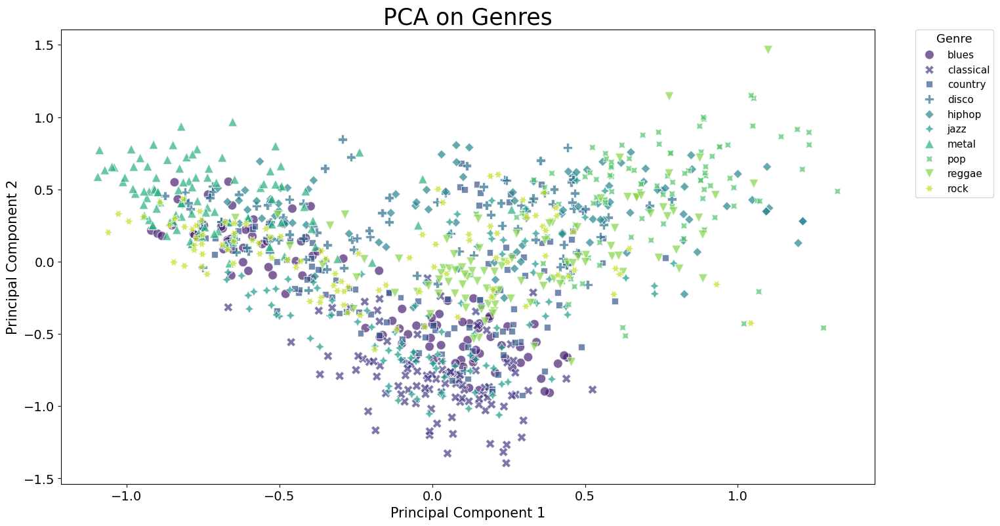

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure with specified size
plt.figure(figsize=(16, 9))

# Create a scatter plot using seaborn
sns.scatterplot(
    x="principal component 1",
    y="principal component 2",
    data=finalDf,
    hue="label",
    alpha=0.7,
    s=100,
    palette='viridis',  # Adding a color palette for visual appeal
    style="label",  # Different markers for different labels if needed
    markers=True  # Use markers to differentiate points
)

# Setting the plot title and font sizes
plt.title('PCA on Genres', fontsize=25)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)  # Adjusting y-tick font size to match x-ticks for consistency
plt.xlabel("Principal Component 1", fontsize=15)
plt.ylabel("Principal Component 2", fontsize=15)

# Legend settings
plt.legend(title='Genre', title_fontsize='13', fontsize='11', loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

# Save the plot as a JPEG file
plt.savefig("PCA_Scatter.jpg", bbox_inches='tight')  # Use bbox_inches='tight' to include legend in saved image

# Show the plot
plt.show()

# MACHINE LEARNING CLASSIFICATION

In [ ]:
!pip install xgboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.1/297.1 MB 2.8 MB/s eta 0:00:00


In [ ]:
# Basic imports
from sklearn import preprocessing
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE

# Classifier imports from sklearn
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

# XGBoost related imports
from xgboost import XGBClassifier, XGBRFClassifier
from xgboost import plot_tree, plot_importance

In [ ]:
df_3 = pd.read_csv(f'{data_path}/features_3_sec.csv')
df_3 = df_3.iloc[0:, 1:]
df_3

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9985,66149,0.349126,0.080515,0.050019,0.000097,1499.083005,164266.886443,1718.707215,85931.574523,3015.559458,...,42.485981,-9.094270,38.326839,-4.246976,31.049839,-5.625813,48.804092,1.818823,38.966969,rock
9986,66149,0.372564,0.082626,0.057897,0.000088,1847.965128,281054.935973,1906.468492,99727.037054,3746.694524,...,32.415203,-12.375726,66.418587,-3.081278,54.414265,-11.960546,63.452255,0.428857,18.697033,rock
9987,66149,0.347481,0.089019,0.052403,0.000701,1346.157659,662956.246325,1561.859087,138762.841945,2442.362154,...,78.228149,-2.524483,21.778994,4.809936,25.980829,1.775686,48.582378,-0.299545,41.586990,rock
9988,66149,0.387527,0.084815,0.066430,0.000320,2084.515327,203891.039161,2018.366254,22860.992562,4313.266226,...,28.323744,-5.363541,17.209942,6.462601,21.442928,2.354765,24.843613,0.675824,12.787750,rock


In [ ]:
import pandas as pd
from sklearn import preprocessing

# Extracting the label column as y and all other columns as X from df_3
y = df_3['label']  # genre variable
X = df_3.loc[:, df_3.columns != 'label']  # select all columns but not the labels

#### NORMALIZE X ####

# Normalize so everything is on the same scale.
cols = X.columns
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)

# Create a new DataFrame with the scaled data
X = pd.DataFrame(np_scaled, columns=cols)

In [ ]:
from sklearn.model_selection import train_test_split

# Splitting the data into 80% training and 20% testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

# Optionally, you can check the size of each set
print("Training set size:", X_train.shape)
print("Testing set size:", X_test.shape)

Training set size: (7992, 58)
Testing set size: (1998, 58)


Accuracy Report for Logistic Regression: 69.87%
Accuracy Report for K-Nearest Neighbors: 91.09%
Accuracy Report for Decision Tree: 65.22%
Accuracy Report for Random Forest: 87.94%
Accuracy Report for Support Vector Machine: 75.88%
Accuracy Report for Multi-layer Perceptron: 82.13%
Accuracy Report for XGBoost: 90.89%


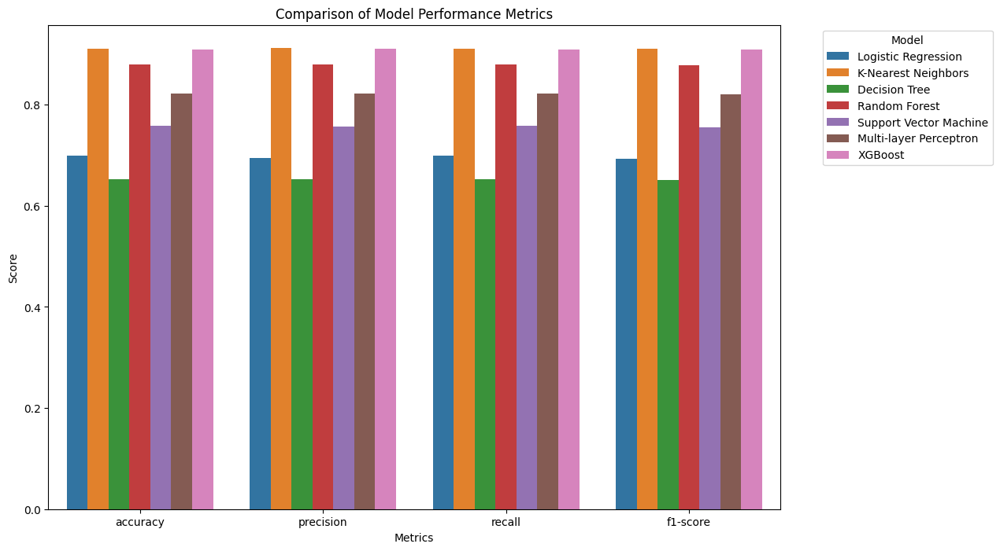

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Encode categorical labels to integers
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)  # Assume 'y' is defined in your dataset

# Split data with encoded labels
X_train, X_test, y_train_encoded, y_test_encoded = train_test_split(X, y_encoded, test_size=0.20, random_state=42)

# Function to assess model accuracy and return metrics
def assess_model_metrics(model, model_name, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    accuracy = accuracy_score(y_test, predictions)
    report = classification_report(y_test, predictions, output_dict=True)
    print(f"Accuracy Report for {model_name}: {accuracy * 100:.2f}%")
    return {
        "model": model_name,
        "accuracy": accuracy,
        "precision": report["weighted avg"]["precision"],
        "recall": report["weighted avg"]["recall"],
        "f1-score": report["weighted avg"]["f1-score"]
    }

# List of models to evaluate
models = [
    LogisticRegression(max_iter=1000),
    KNeighborsClassifier(),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    SVC(),
    MLPClassifier(max_iter=1000),
    XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
]

# Model names
model_names = [
    "Logistic Regression",
    "K-Nearest Neighbors",
    "Decision Tree",
    "Random Forest",
    "Support Vector Machine",
    "Multi-layer Perceptron",
    "XGBoost"
]

# Evaluate models and collect results
results = []
for model, name in zip(models, model_names):
    result = assess_model_metrics(model, name, X_train, X_test, y_train_encoded, y_test_encoded)
    results.append(result)

# Create DataFrame for results
results_df = pd.DataFrame(results)

# Plotting the results
plt.figure(figsize=(12, 8))
sns.barplot(data=results_df.melt(id_vars=["model"], value_vars=["accuracy", "precision", "recall", "f1-score"]),
            x="variable", y="value", hue="model")
plt.title("Comparison of Model Performance Metrics")
plt.ylabel("Score")
plt.xlabel("Metrics")
plt.legend(title="Model", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


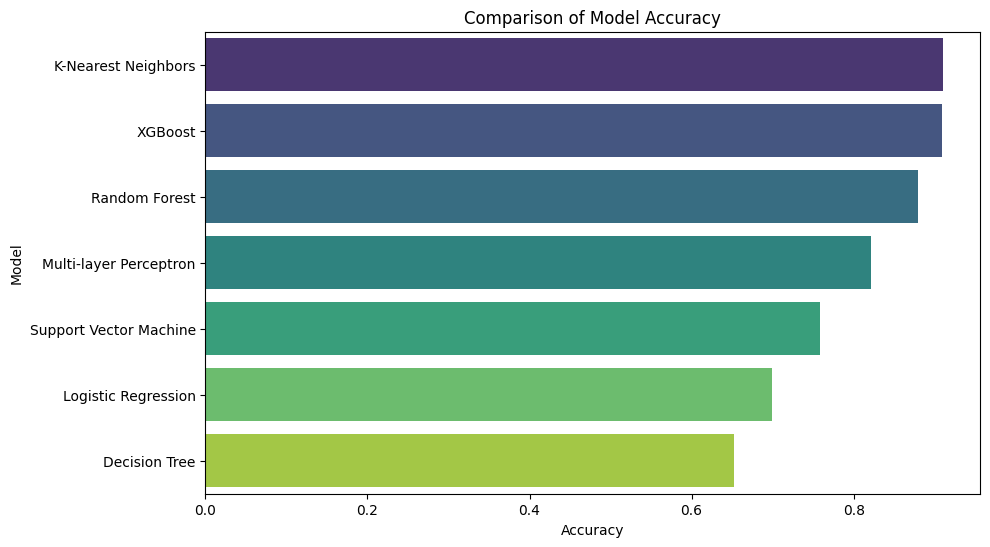

In [ ]:
# Convert the results to a DataFrame
results_df = pd.DataFrame(results)

# Sort the DataFrame by accuracy in descending order
sorted_df = results_df.sort_values(by='accuracy', ascending=False)

# Plotting the sorted accuracies
plt.figure(figsize=(10, 6))
sns.barplot(data=sorted_df, x='accuracy', y='model', palette="viridis")
plt.title('Comparison of Model Accuracy')
plt.xlabel('Accuracy')
plt.ylabel('Model')
plt.show()

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Encode categorical labels to integers
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)  # 'y' should be the array of labels

# Split data with encoded labels
X_train, X_test, y_train_encoded, y_test_encoded = train_test_split(X, y_encoded, test_size=0.20, random_state=42)

# Function to assess model accuracy and print summary of metrics
def assess_model_accuracy(model, model_name, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    accuracy = accuracy_score(y_test, predictions)
    report = classification_report(y_test, predictions)
    conf_mat = confusion_matrix(y_test, predictions)

    print(f"Accuracy Report for {model_name}")
    print(f"Accuracy: {accuracy * 100:.2f}%")
    print("Classification Report:")
    print(report)
    print("Confusion Matrix:")
    print(conf_mat)
    print("-----" * 10)  # Separator for readability

# Logistic Regression
logistic_model = LogisticRegression(max_iter=1000)
assess_model_accuracy(logistic_model, "Logistic Regression", X_train, X_test, y_train_encoded, y_test_encoded)

# K-Nearest Neighbors
knn_model = KNeighborsClassifier()
assess_model_accuracy(knn_model, "K-Nearest Neighbors", X_train, X_test, y_train_encoded, y_test_encoded)

# Decision Tree
decision_tree_model = DecisionTreeClassifier()
assess_model_accuracy(decision_tree_model, "Decision Tree", X_train, X_test, y_train_encoded, y_test_encoded)

# Random Forest
random_forest_model = RandomForestClassifier()
assess_model_accuracy(random_forest_model, "Random Forest", X_train, X_test, y_train_encoded, y_test_encoded)

# Support Vector Machine
svm_model = SVC()
assess_model_accuracy(svm_model, "Support Vector Machine", X_train, X_test, y_train_encoded, y_test_encoded)

# Multi-layer Perceptron
mlp_model = MLPClassifier(max_iter=1000)
assess_model_accuracy(mlp_model, "Multi-layer Perceptron", X_train, X_test, y_train_encoded, y_test_encoded)

# XGBoost
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
assess_model_accuracy(xgb_model, "XGBoost", X_train, X_test, y_train_encoded, y_test_encoded)


Accuracy Report for Logistic Regression
Accuracy: 69.87%
Classification Report:
              precision    recall  f1-score   support

           0       0.63      0.68      0.66       208
           1       0.83      0.94      0.88       203
           2       0.58      0.61      0.60       186
           3       0.63      0.59      0.61       199
           4       0.75      0.65      0.70       218
           5       0.76      0.72      0.74       192
           6       0.73      0.90      0.80       204
           7       0.73      0.85      0.79       180
           8       0.70      0.64      0.67       211
           9       0.59      0.41      0.48       197

    accuracy                           0.70      1998
   macro avg       0.69      0.70      0.69      1998
weighted avg       0.69      0.70      0.69      1998

Confusion Matrix:
[[142   3  11   4   0  10  23   0   8   7]
 [  0 190   4   0   0   7   0   0   0   2]
 [ 19   2 114  12   1  12   1   9   4  12]
 [  4   6  10 

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

# Gradient Boosting Classifier
gb_model = GradientBoostingClassifier()
assess_model_accuracy(gb_model, "Gradient Boosting Classifier", X_train, X_test, y_train_encoded, y_test_encoded)

Accuracy Report for Gradient Boosting Classifier
Accuracy: 83.58%
Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.82      0.83       208
           1       0.92      0.96      0.94       203
           2       0.70      0.80      0.75       186
           3       0.76      0.80      0.78       199
           4       0.89      0.81      0.85       218
           5       0.84      0.89      0.87       192
           6       0.92      0.92      0.92       204
           7       0.86      0.89      0.88       180
           8       0.85      0.81      0.83       211
           9       0.76      0.66      0.71       197

    accuracy                           0.84      1998
   macro avg       0.84      0.84      0.83      1998
weighted avg       0.84      0.84      0.84      1998

Confusion Matrix:
[[171   0  14   5   0  10   2   0   3   3]
 [  0 194   0   0   0   7   0   0   0   2]
 [ 13   0 149   4   1   6   1   5   5   2]
 [  1

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best parameters: {'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'distance'}
Best cross-validation score: 0.92
Test accuracy: 0.94


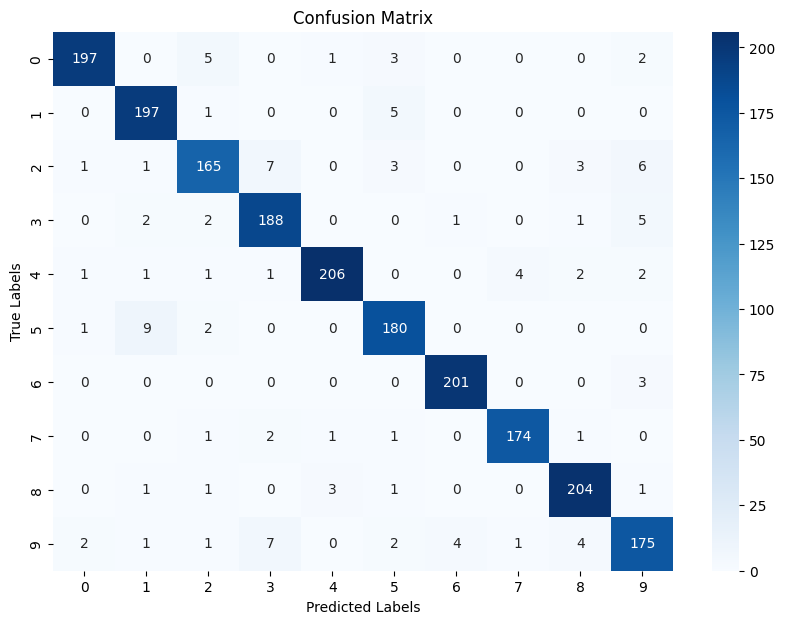

              precision    recall  f1-score   support

           0       0.98      0.95      0.96       208
           1       0.93      0.97      0.95       203
           2       0.92      0.89      0.90       186
           3       0.92      0.94      0.93       199
           4       0.98      0.94      0.96       218
           5       0.92      0.94      0.93       192
           6       0.98      0.99      0.98       204
           7       0.97      0.97      0.97       180
           8       0.95      0.97      0.96       211
           9       0.90      0.89      0.90       197

    accuracy                           0.94      1998
   macro avg       0.94      0.94      0.94      1998
weighted avg       0.94      0.94      0.94      1998



In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assuming X and y are your feature set and target variable, respectively
# Make sure y is properly encoded
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)  # Encoding string labels to integers

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.20, random_state=42)

# Create KNN model and set up hyperparameter tuning
knn = KNeighborsClassifier()
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

# Create GridSearchCV object to find the best parameters
grid = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy', verbose=1)
grid.fit(X_train, y_train)

# Output the best parameters and best score
print("Best parameters:", grid.best_params_)
print("Best cross-validation score: {:.2f}".format(grid.best_score_))

# Use the best model found by GridSearchCV
best_knn = grid.best_estimator_

# Predictions for the test data using the best KNN model
y_pred = best_knn.predict(X_test)

# Compute the accuracy score
accuracy = accuracy_score(y_test, y_pred)
print(f"Test accuracy: {accuracy:.2f}")

# Compute the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Print classification report for detailed evaluation
print(classification_report(y_test, y_pred))


In [ ]:
import xgboost as xgb

# Create a basic XGBoost classifier
xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')

# Define the parameter grid
param_grid = {
    'max_depth': [3, 5, 7],
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2]
}

# Set up GridSearchCV
grid = GridSearchCV(xgb_model, param_grid, cv=3, scoring='accuracy', verbose=2)
grid.fit(X_train, y_train)


Fitting 3 folds for each of 27 candidates, totalling 81 fits
[CV] END ...learning_rate=0.01, max_depth=3, n_estimators=50; total time=   7.6s
[CV] END ...learning_rate=0.01, max_depth=3, n_estimators=50; total time=   1.9s
[CV] END ...learning_rate=0.01, max_depth=3, n_estimators=50; total time=   2.9s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   2.1s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=   2.9s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=100; total time=  11.4s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=  10.6s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   4.3s
[CV] END ..learning_rate=0.01, max_depth=3, n_estimators=200; total time=   4.3s
[CV] END ...learning_rate=0.01, max_depth=5, n_estimators=50; total time=   5.4s
[CV] END ...learning_rate=0.01, max_depth=5, n_estimators=50; total time=   3.1s
[CV] END ...learning_rate=0.01, max_depth=5, n_e

GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False,
                                     eval_metric='mlogloss', feature_types=None,
                                     gamma=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate...
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             param_grid={'learning_rate': [0.01, 0.1, 0.2],
                         'max_depth': [3, 5, 7],
                         'n_estimators': [50, 100, 200]},
             scoring='accuracy', verbose=2)

In [ ]:
# Evaluate the best model found by GridSearchCV
best_model = grid.best_estimator_
y_pred = best_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Best model accuracy on test data:", accuracy)


Best model accuracy on test data: 0.9079079079079079


Best parameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 200}
Best cross-validation score: 0.88
Test accuracy: 0.91


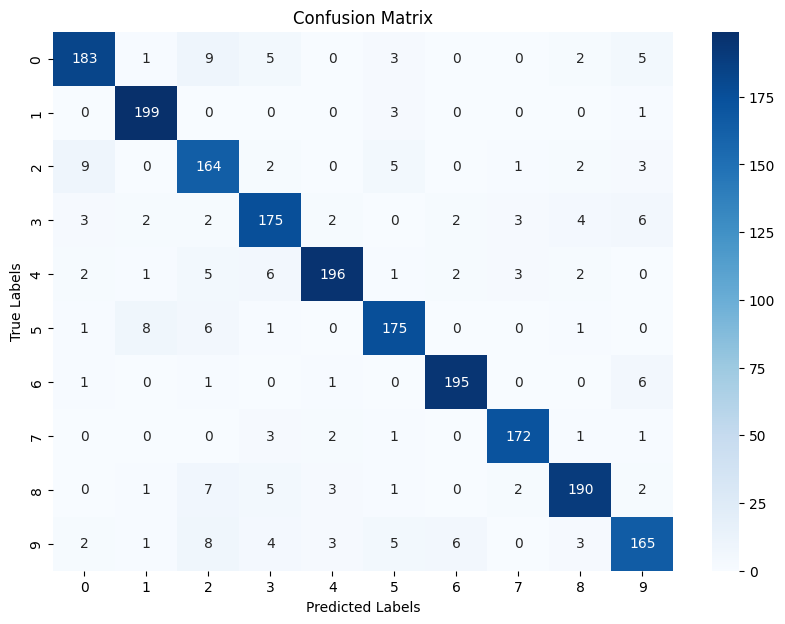

              precision    recall  f1-score   support

           0       0.91      0.88      0.89       208
           1       0.93      0.98      0.96       203
           2       0.81      0.88      0.85       186
           3       0.87      0.88      0.88       199
           4       0.95      0.90      0.92       218
           5       0.90      0.91      0.91       192
           6       0.95      0.96      0.95       204
           7       0.95      0.96      0.95       180
           8       0.93      0.90      0.91       211
           9       0.87      0.84      0.85       197

    accuracy                           0.91      1998
   macro avg       0.91      0.91      0.91      1998
weighted avg       0.91      0.91      0.91      1998



In [ ]:

# Output the best parameters and best score
print("Best parameters:", grid.best_params_)
print("Best cross-validation score: {:.2f}".format(grid.best_score_))



# Predictions for the test data using the best KNN model
y_pred = best_model.predict(X_test)

# Compute the accuracy score
accuracy = accuracy_score(y_test, y_pred)
print(f"Test accuracy: {accuracy:.2f}")

# Compute the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Print classification report for detailed evaluation
print(classification_report(y_test, y_pred))


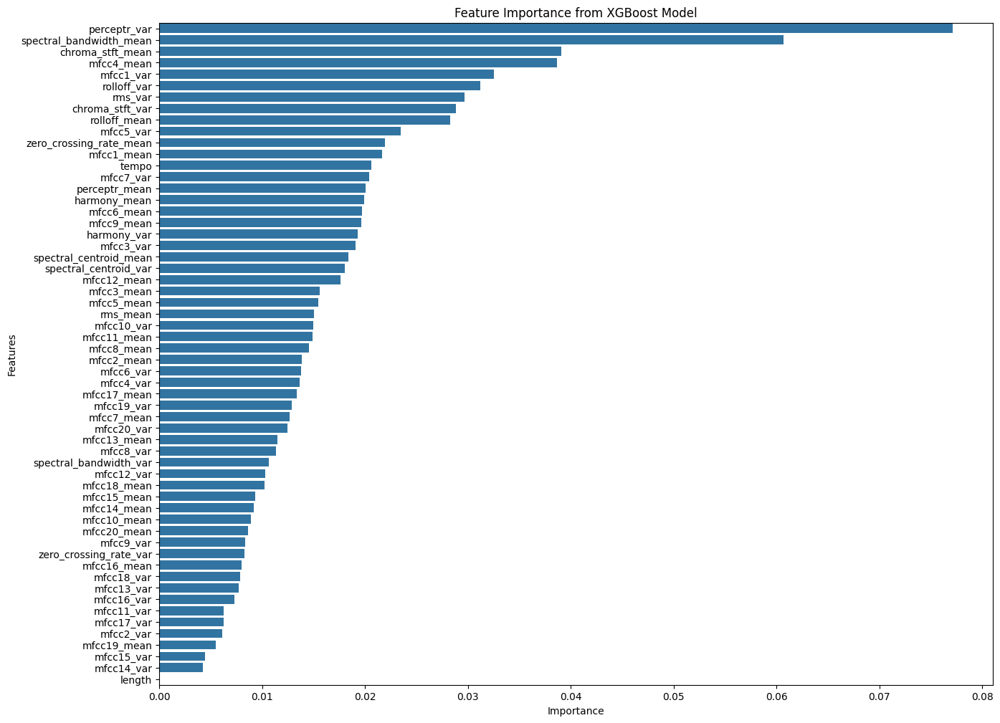

In [ ]:
# Get feature importance
importance = best_model.feature_importances_

# Create a DataFrame for easier handling
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importance
}).sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(15, 12))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance from XGBoost Model')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()


Top 10 Important Features:
                    Feature  Importance
16             perceptr_var    0.080099
7   spectral_bandwidth_mean    0.058651
1          chroma_stft_mean    0.038701
24               mfcc4_mean    0.037839
2           chroma_stft_var    0.033776
10              rolloff_var    0.033556
19                mfcc1_var    0.029783
9              rolloff_mean    0.028313
4                   rms_var    0.027574
27                mfcc5_var    0.026225


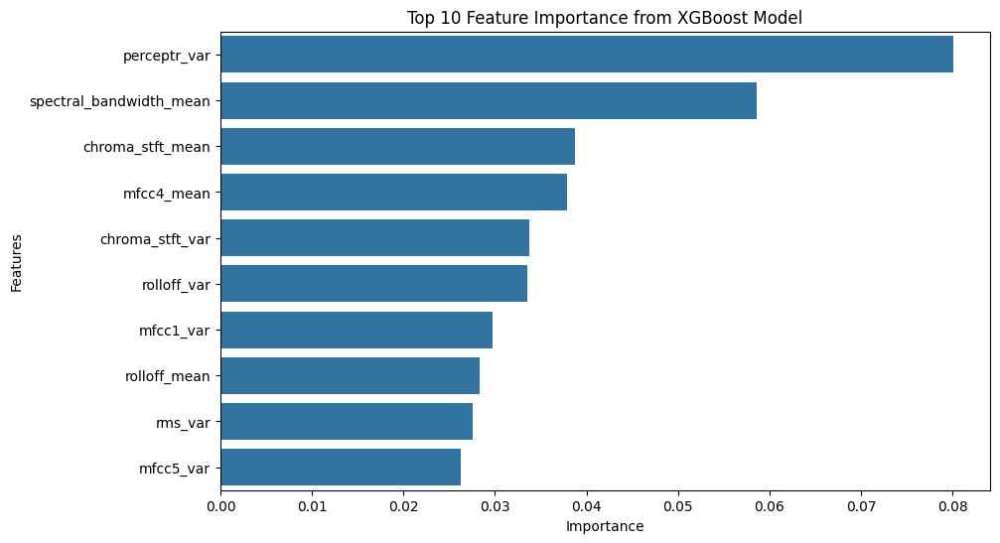

In [ ]:
# Assuming final_model is your trained XGBoost model
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Get feature importance
importance = final_model.feature_importances_

# Create a DataFrame for easier handling
features = X.columns  # Make sure X is your feature DataFrame
feature_importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': importance
})

# Sort the features by importance and select the top 10
top_features = feature_importance_df.sort_values(by='Importance', ascending=False).head(10)

# Print the top 10 features
print("Top 10 Important Features:")
print(top_features)

# Optionally, plot the top 10 feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=top_features)
plt.title('Top 10 Feature Importance from XGBoost Model')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()

## Clssification for with MelSpectograms images

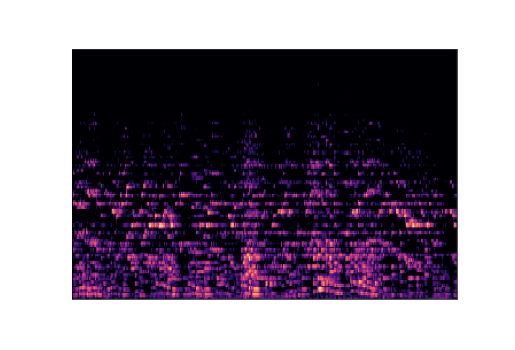

Loaded image dimensions: (432, 288)


In [ ]:
from PIL import Image

# Load and display an example image
image_path = '/content/drive/MyDrive/602FinalProject/Data/images_original/classical/classical00000.png'
image = Image.open(image_path)
plt.imshow(image)
plt.axis('off')  # Turn off axis numbers and ticks
plt.show()
print("Loaded image dimensions:", image.size)


In [ ]:
print(os.listdir('/content/drive/MyDrive/602FinalProject/Data/images_original'))

['pop', 'classical', 'jazz', 'hiphop', 'blues', 'disco', 'reggae', 'country', 'rock', 'metal']


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, LearningRateScheduler

# Load the ResNet50 pre-trained model without the top layer
base_model = ResNet50(include_top=False, weights='imagenet', input_shape=(288, 432, 3))

# Freeze all the layers in the base model
for layer in base_model.layers:
    layer.trainable = False

# Adding custom layers on top of ResNet50
x = layers.GlobalAveragePooling2D()(base_model.output)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(10, activation='softmax')(x)  # Adjust the number of units based on the number of classes

# Creating the final model
model = Model(inputs=base_model.input, outputs=x)

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Set up the data generators with a validation split
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2  # Validation split set here
)

train_generator = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/602FinalProject/Data/images_original',  # Update your path
    target_size=(288, 432),
    batch_size=32,
    class_mode='categorical',
    subset='training'  # Specify subset as training
)

validation_generator = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/602FinalProject/Data/images_original',  # Update your path
    target_size=(288, 432),
    batch_size=32,
    class_mode='categorical',
    subset='validation'  # Specify subset as validation
)

# Callbacks for monitoring and improving training
callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True),
    ModelCheckpoint('best_model.h5', monitor='val_accuracy', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5)
]

# Train the model
history = model.fit(
    train_generator,
    epochs=50,
    validation_data=validation_generator,
    callbacks=callbacks
)

# Plotting the training results
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()


Found 800 images belonging to 10 classes.
Found 199 images belonging to 10 classes.
Epoch 1/50
25/25 [==============================] - 696s 28s/step - loss: 3.1790 - accuracy: 0.1013 - val_loss: 2.4449 - val_accuracy: 0.1055 - lr: 0.0010
Epoch 2/50
25/25 [==============================] - 640s 26s/step - loss: 2.4640 - accuracy: 0.0887 - val_loss: 2.3177 - val_accuracy: 0.1055 - lr: 0.0010
Epoch 3/50
25/25 [==============================] - 601s 24s/step - loss: 2.3157 - accuracy: 0.1200 - val_loss: 2.3090 - val_accuracy: 0.1005 - lr: 0.0010
Epoch 4/50
14/25 [===============>..............] - ETA: 3:24 - loss: 2.3312 - accuracy: 0.1071

# RECOMMENDER SYSTEM

In [ ]:
import pandas as pd
from sklearn import preprocessing


# Load the dataset
data = pd.read_csv(f'{data_path}/features_30_sec.csv', index_col='filename')

# Extract labels and then drop non-feature columns
labels = data[['label']]  # This will store the labels separately
data.drop(columns=['length', 'label'], inplace=True)  # Drop non-feature columns directly from data

# Display the first few rows of the modified dataframe
print(data.head())

# Scale the data using StandardScaler for better performance in many models
scaler = preprocessing.StandardScaler()  # Using StandardScaler for zero mean and unit variance
data_scaled = scaler.fit_transform(data)

# Confirm the operation completed and check the type of scaled data
print('Scaled data type:', type(data_scaled))  # This should typically print <class 'numpy.ndarray'>

                 chroma_stft_mean  chroma_stft_var  rms_mean   rms_var  \
filename                                                                 
blues.00000.wav          0.350088         0.088757  0.130228  0.002827   
blues.00001.wav          0.340914         0.094980  0.095948  0.002373   
blues.00002.wav          0.363637         0.085275  0.175570  0.002746   
blues.00003.wav          0.404785         0.093999  0.141093  0.006346   
blues.00004.wav          0.308526         0.087841  0.091529  0.002303   

                 spectral_centroid_mean  spectral_centroid_var  \
filename                                                         
blues.00000.wav             1784.165850          129774.064525   
blues.00001.wav             1530.176679          375850.073649   
blues.00002.wav             1552.811865          156467.643368   
blues.00003.wav             1070.106615          184355.942417   
blues.00004.wav             1835.004266          343399.939274   

                 s

In [ ]:
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import StandardScaler


# Calculate cosine similarity
similarity_matrix = cosine_similarity(data_scaled)

# Print type and shape of the matrix to confirm its size
print('Cosine similarity matrix type:', type(similarity_matrix))
print('Cosine similarity matrix shape:', similarity_matrix.shape)

# Optional: Convert to DataFrame for better handling and visualization
similarity_df = pd.DataFrame(similarity_matrix, index=data.index, columns=data.index)

# Display the first few rows to inspect
print(similarity_df.head())

Cosine similarity matrix type: <class 'numpy.ndarray'>
Cosine similarity matrix shape: (1000, 1000)
filename         blues.00000.wav  blues.00001.wav  blues.00002.wav  \
filename                                                             
blues.00000.wav         1.000000         0.049231         0.589618   
blues.00001.wav         0.049231         1.000000        -0.096834   
blues.00002.wav         0.589618        -0.096834         1.000000   
blues.00003.wav         0.284862         0.520903         0.210411   
blues.00004.wav         0.025561         0.080749         0.400266   

filename         blues.00003.wav  blues.00004.wav  blues.00005.wav  \
filename                                                             
blues.00000.wav         0.284862         0.025561        -0.346688   
blues.00001.wav         0.520903         0.080749         0.307856   
blues.00002.wav         0.210411         0.400266        -0.082019   
blues.00003.wav         1.000000         0.126437         0

In [ ]:
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import StandardScaler


def find_similar_songs(song_name, similarity_df, top_n=5):
    """
    Finds and returns the top 'n' songs most similar to the given song name based on cosine similarity,
    excluding the song itself and any songs with perfect similarity (similarity == 1).

    Args:
    song_name (str): The name of the song to find similarities for.
    similarity_df (DataFrame): A DataFrame containing cosine similarity scores between songs.
    top_n (int): The number of top similar songs to return.

    Returns:
    pandas.Series: Top 'n' similar songs sorted by similarity score, excluding the song itself.
    """
    # Check if the song is in the index
    if song_name not in similarity_df.index:
        return f"Song named '{song_name}' not found in the dataset."

    # Get all scores for the given song and sort them
    similar_scores = similarity_df[song_name].sort_values(ascending=False)

    # Filter out the song itself and any songs with similarity of 1
    filtered_scores = similar_scores[(similar_scores < 1)]

    # Get the top 'n' similar songs
    top_similar_songs = filtered_scores.head(top_n)

    return top_similar_songs

In [ ]:
song_to_search = 'classical.00020.wav' # Replace with your actual song filename
top_matches = find_similar_songs(song_to_search, similarity_df)
print(f"Top 5 similar songs to {song_to_search}:\n{top_matches}")

Top 5 similar songs to classical.00020.wav:
filename
classical.00014.wav    0.832175
classical.00028.wav    0.829155
classical.00066.wav    0.817524
classical.00027.wav    0.812585
classical.00021.wav    0.798007
Name: classical.00020.wav, dtype: float64


In [ ]:
print("Classicla song taken as test")
ipd.Audio(f'{data_path}/genres_original/classical/classical.00020.wav')


Classicla song taken as test


In [ ]:
print("Songs recommended as the Genre")
ipd.Audio(f'{data_path}/genres_original/classical/classical.00014.wav')

Songs recommended as the Genre


In [ ]:
song_to_search = 'rock.00020.wav' # Replace with your actual song filename
top_matches = find_similar_songs(song_to_search, similarity_df)
print(f"Top 5 similar songs to {song_to_search}:\n{top_matches}")

Top 5 similar songs to rock.00020.wav:
filename
rock.00024.wav    0.914190
rock.00026.wav    0.910803
rock.00017.wav    0.874609
rock.00025.wav    0.873707
rock.00087.wav    0.862328
Name: rock.00020.wav, dtype: float64


In [ ]:
print("Rock song taken as test")
ipd.Audio(f'{data_path}/genres_original/rock/rock.00023.wav')

Rock song taken as test


In [ ]:
print("Songs recommended as the Genre")
ipd.Audio(f'{data_path}/genres_original/rock/rock.00087.wav')

Songs recommended as the Genre
